##### Pré-processamento

In [1]:
# Importar as bibliotecas necessárias:
import os
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import numpy as np
import pandas as pd
from random import choice
from copy import deepcopy
import seaborn as sns
sns.set_theme(style="darkgrid")
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings('ignore')

device = 'cuda' if torch.cuda.is_available else 'cpu'
print(device)

cuda


In [2]:
# Ler os dados:
data = np.loadtxt('subsfin.txt', delimiter=' ')
data = pd.DataFrame(data)
data

,0,1,2,3,4,5,6,7,8,9,...,42,43,44,45,46,47,48,49,50,51
0,18.61,19.04,18.82,19.18,18.76,18.75,18.17,18.39,18.37,17.02,...,16.93,16.99,16.76,16.72,16.13,15.32,16.44,15.81,15.10,14.94
1,18.60,19.04,18.80,19.22,18.77,18.75,18.17,18.39,18.39,17.01,...,16.94,16.98,16.76,16.70,16.15,15.32,16.44,15.80,15.10,14.93
2,18.59,19.03,18.79,19.26,18.77,18.75,18.17,18.38,18.38,17.01,...,16.94,16.95,16.75,16.70,16.15,15.32,16.43,15.79,15.10,14.92
3,18.58,19.03,18.78,19.30,18.77,18.75,18.16,18.38,18.38,17.01,...,16.92,16.96,16.74,16.69,16.15,15.32,16.42,15.79,15.10,14.91
4,18.57,19.03,18.77,19.29,18.77,18.75,18.16,18.38,18.37,17.01,...,16.93,16.97,16.73,16.68,16.12,15.32,16.42,15.78,15.10,14.90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14395,20.89,21.18,21.05,21.25,20.77,20.79,20.28,20.25,20.28,19.45,...,20.57,20.71,20.70,20.69,20.22,19.93,20.80,20.89,19.85,19.25
14396,20.89,21.18,21.06,21.24,20.77,20.79,20.28,20.26,20.27,19.46,...,20.56,20.71,20.70,20.68,20.22,19.92,20.81,20.89,19.85,19.26
14397,20.89,21.17,21.06,21.24,20.77,20.79,20.28,20.25,20.28,19.46,...,20.56,20.70,20.69,20.68,20.21,19.92,20.80,20.89,19.86,19.26
14398,20.89,21.17,21.06,21.23,20.76,20.79,20.27,20.26,20.27,19.47,...,20.56,20.70,20.69,20.68,20.21,19.92,20.80,20.88,19.86,19.27


In [145]:
# Normalizar os dados
scaler = MinMaxScaler()
data = scaler.fit_transform(data)
df = pd.DataFrame(data)
df

,0,1,2,3,4,5,6,7,8,9,...,42,43,44,45,46,47,48,49,50,51
0,0.129259,0.145735,0.136714,0.133412,0.134817,0.118622,0.578868,0.091753,0.102273,0.098662,...,0.098221,0.101186,0.096729,0.1080,0.096275,0.099366,0.086671,0.091179,0.111727,0.110666
1,0.128257,0.145735,0.134509,0.138135,0.136126,0.118622,0.578868,0.091753,0.104798,0.097826,...,0.098932,0.100488,0.096729,0.1064,0.097681,0.099366,0.086671,0.090437,0.111727,0.109864
2,0.127255,0.144550,0.133407,0.142857,0.136126,0.118622,0.578868,0.090722,0.103535,0.097826,...,0.098932,0.098395,0.096033,0.1064,0.097681,0.099366,0.086014,0.089696,0.111727,0.109062
3,0.126253,0.144550,0.132304,0.147580,0.136126,0.118622,0.578362,0.090722,0.103535,0.097826,...,0.097509,0.099093,0.095338,0.1056,0.097681,0.099366,0.085358,0.089696,0.111727,0.108260
4,0.125251,0.144550,0.131202,0.146399,0.136126,0.118622,0.578362,0.090722,0.102273,0.097826,...,0.098221,0.099791,0.094642,0.1048,0.095573,0.099366,0.085358,0.088955,0.111727,0.107458
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14395,0.357715,0.399289,0.382580,0.377804,0.397906,0.378827,0.685541,0.283505,0.343434,0.301839,...,0.357295,0.360782,0.370912,0.4256,0.383696,0.424242,0.372948,0.467754,0.488114,0.456295
14396,0.357715,0.399289,0.383682,0.376623,0.397906,0.378827,0.685541,0.284536,0.342172,0.302676,...,0.356584,0.360782,0.370912,0.4248,0.383696,0.423538,0.373605,0.467754,0.488114,0.457097
14397,0.357715,0.398104,0.383682,0.376623,0.397906,0.378827,0.685541,0.283505,0.343434,0.302676,...,0.356584,0.360084,0.370216,0.4248,0.382994,0.423538,0.372948,0.467754,0.488906,0.457097
14398,0.357715,0.398104,0.383682,0.375443,0.396597,0.378827,0.685035,0.284536,0.342172,0.303512,...,0.356584,0.360084,0.370216,0.4248,0.382994,0.423538,0.372948,0.467013,0.488906,0.457899


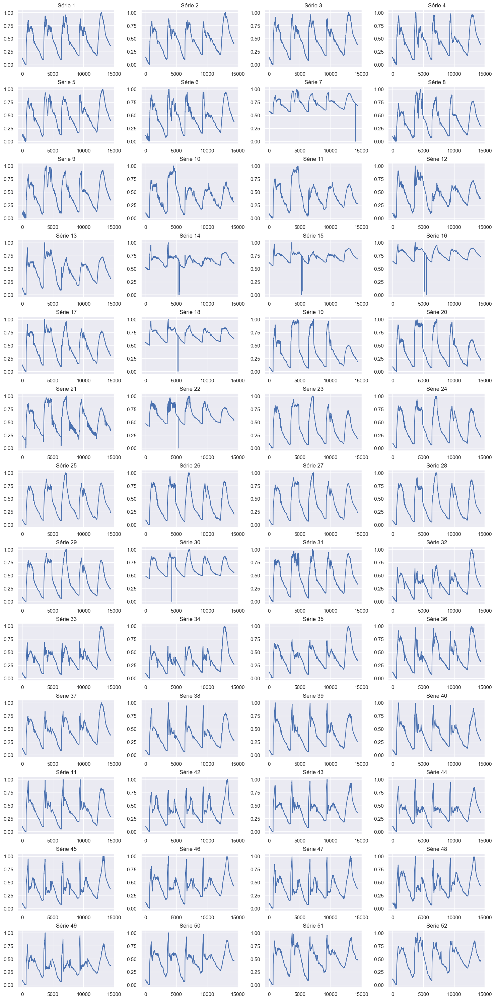

In [4]:
# Visualização das 52 séries
janela, graficos = plt.subplots(nrows=13, ncols=4, figsize=(15, 30))
plt.tight_layout(pad=1.5)
subplots = janela.axes

for i in df.columns:
    df_new = pd.DataFrame(df[i])
    subplots[i].plot(df_new)
    subplots[i].set_title(f'Série {i+1}');

In [5]:
# Tratar os outliers de cada série
df_clean = pd.DataFrame()
for serie in df.columns.values:
    df_clean[serie] = pd.DataFrame(df[serie])

    # Identificação dos Outliers - Método Z-Score
    out = (df_clean[serie] - np.mean(df_clean[serie])) / np.std(df_clean[serie])
    idx = np.where((np.abs(out) >= 3) | (np.abs(out) <= -3))

    # Substituição dos Outliers pela média
    df_clean[serie].iloc[idx] = np.mean(df_clean[serie])

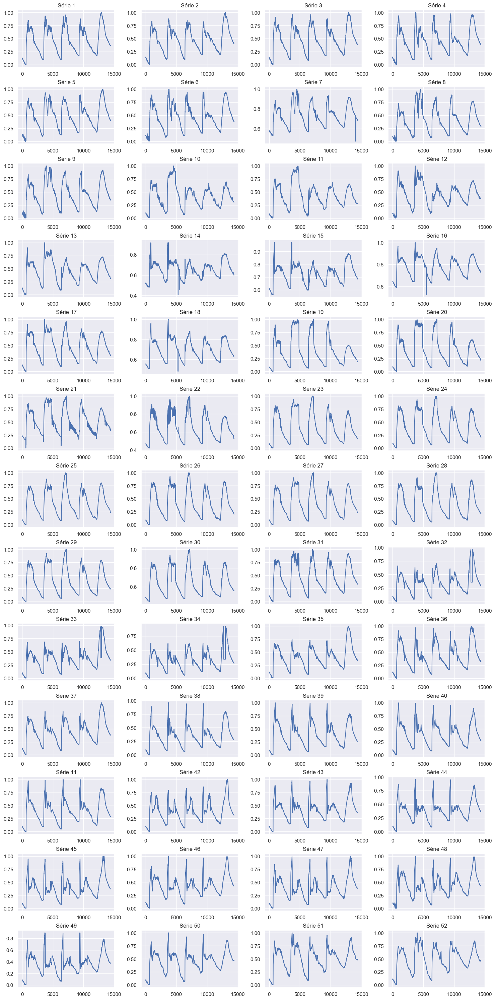

In [6]:
# Visualização das 52 séries - Após tratamento dos outliers
janela, graficos = plt.subplots(nrows=13, ncols=4, figsize=(15, 30))
plt.tight_layout(pad=1.5)
subplots = janela.axes

for i in df_clean.columns:
    df_new = pd.DataFrame(df_clean[i])
    subplots[i].plot(df_new)
    subplots[i].set_title(f'Série {i+1}');

##### Abordagem Individual

In [7]:
# Escolher aleatoriamente uma série temporal
serie = choice(df_clean.columns.values)
df_copy = df_clean[serie]
df_copy = pd.DataFrame(df_copy)
df_copy.rename(columns={serie: 't'}, inplace=True)

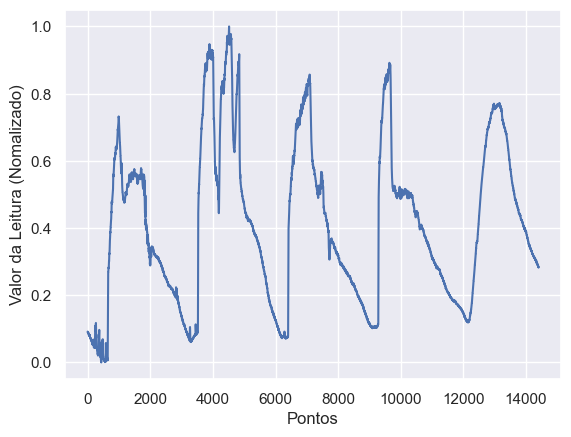

In [8]:
# Série escolhida aleatoriamente
plt.xlabel('Pontos')
plt.ylabel('Valor da Leitura (Nomalizado)')
sns.lineplot(data=df_copy, x=df_copy.index, y='t');

In [9]:
# Janelamento
window_size = 100
for t in range(1, window_size + 1)[::-1]:
    df_copy[f't{t}'] = df_copy['t'].shift(t)

In [10]:
df_copy

,t,t100,t99,t98,t97,t96,t95,t94,t93,t92,...,t10,t9,t8,t7,t6,t5,t4,t3,t2,t1
0,0.091753,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.091753,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.091753
2,0.090722,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.091753,0.091753
3,0.090722,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.091753,0.091753,0.090722
4,0.090722,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.091753,0.091753,0.090722,0.090722
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14395,0.283505,0.307216,0.307216,0.307216,0.306186,0.306186,0.306186,0.306186,0.305155,0.305155,...,0.288660,0.287629,0.287629,0.286598,0.286598,0.286598,0.284536,0.284536,0.284536,0.284536
14396,0.284536,0.307216,0.307216,0.306186,0.306186,0.306186,0.306186,0.305155,0.305155,0.305155,...,0.287629,0.287629,0.286598,0.286598,0.286598,0.284536,0.284536,0.284536,0.284536,0.283505
14397,0.283505,0.307216,0.306186,0.306186,0.306186,0.306186,0.305155,0.305155,0.305155,0.305155,...,0.287629,0.286598,0.286598,0.286598,0.284536,0.284536,0.284536,0.284536,0.283505,0.284536
14398,0.284536,0.306186,0.306186,0.306186,0.306186,0.305155,0.305155,0.305155,0.305155,0.305155,...,0.286598,0.286598,0.286598,0.284536,0.284536,0.284536,0.284536,0.283505,0.284536,0.283505


In [11]:
df_copy.dropna(inplace=True)
df_copy

,t,t100,t99,t98,t97,t96,t95,t94,t93,t92,...,t10,t9,t8,t7,t6,t5,t4,t3,t2,t1
100,0.071134,0.091753,0.091753,0.090722,0.090722,0.090722,0.089691,0.089691,0.088660,0.088660,...,0.073196,0.072165,0.072165,0.072165,0.072165,0.072165,0.072165,0.071134,0.071134,0.071134
101,0.071134,0.091753,0.090722,0.090722,0.090722,0.089691,0.089691,0.088660,0.088660,0.088660,...,0.072165,0.072165,0.072165,0.072165,0.072165,0.072165,0.071134,0.071134,0.071134,0.071134
102,0.071134,0.090722,0.090722,0.090722,0.089691,0.089691,0.088660,0.088660,0.088660,0.088660,...,0.072165,0.072165,0.072165,0.072165,0.072165,0.071134,0.071134,0.071134,0.071134,0.071134
103,0.070103,0.090722,0.090722,0.089691,0.089691,0.088660,0.088660,0.088660,0.088660,0.088660,...,0.072165,0.072165,0.072165,0.072165,0.071134,0.071134,0.071134,0.071134,0.071134,0.071134
104,0.070103,0.090722,0.089691,0.089691,0.088660,0.088660,0.088660,0.088660,0.088660,0.089691,...,0.072165,0.072165,0.072165,0.071134,0.071134,0.071134,0.071134,0.071134,0.071134,0.070103
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14395,0.283505,0.307216,0.307216,0.307216,0.306186,0.306186,0.306186,0.306186,0.305155,0.305155,...,0.288660,0.287629,0.287629,0.286598,0.286598,0.286598,0.284536,0.284536,0.284536,0.284536
14396,0.284536,0.307216,0.307216,0.306186,0.306186,0.306186,0.306186,0.305155,0.305155,0.305155,...,0.287629,0.287629,0.286598,0.286598,0.286598,0.284536,0.284536,0.284536,0.284536,0.283505
14397,0.283505,0.307216,0.306186,0.306186,0.306186,0.306186,0.305155,0.305155,0.305155,0.305155,...,0.287629,0.286598,0.286598,0.286598,0.284536,0.284536,0.284536,0.284536,0.283505,0.284536
14398,0.284536,0.306186,0.306186,0.306186,0.306186,0.305155,0.305155,0.305155,0.305155,0.305155,...,0.286598,0.286598,0.286598,0.284536,0.284536,0.284536,0.284536,0.283505,0.284536,0.283505


In [12]:
# Divisão variáveis dependentes e independentes
y, X = df_copy.values[:, 0], df_copy.values[:, 1:]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.40, random_state=42, shuffle=False)

# Divisão 60% Treino, 40% Teste
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

(8580, 100) (8580,) (5720, 100) (5720,)


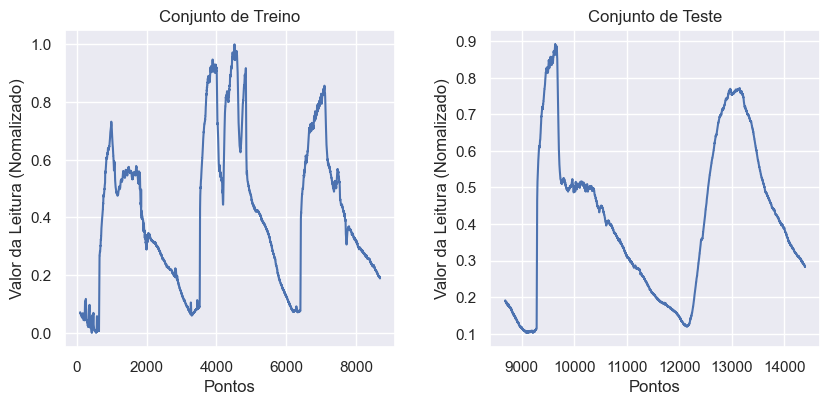

In [13]:
janela, graficos = plt.subplots(nrows=1, ncols=2, figsize=(9, 4.5))
plt.tight_layout(pad=3.0)
subplots = janela.axes

subplots[0].set_xlabel('Pontos')
subplots[0].set_ylabel('Valor da Leitura (Nomalizado)')
subplots[0].set_title('Conjunto de Treino')
sns.lineplot(data=df_copy[:y_train.shape[0]],
             x=df_copy.index[:y_train.shape[0]],
             y=y_train,
             ax=graficos[0])

subplots[1].set_xlabel('Pontos')
subplots[1].set_ylabel('Valor da Leitura (Nomalizado)')
subplots[1].set_title('Conjunto de Teste')
sns.lineplot(data=df_copy[y_train.shape[0]:], 
             x=df_copy.index[y_train.shape[0]:], 
             y=y_test,
             ax=graficos[1]);

In [14]:
# Incluindo dimensão para o PyTorch
X_train = X_train.reshape([-1, window_size, 1])
X_test = X_test.reshape([-1, window_size, 1])
y_train = y_train.reshape([-1, 1])
y_test = y_test.reshape([-1, 1])

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((8580, 100, 1), (5720, 100, 1), (8580, 1), (5720, 1))

In [15]:
# Convertendo em Tensores
X_train = torch.tensor(X_train).float()
X_test = torch.tensor(X_test).float()
y_train = torch.tensor(y_train).float()
y_test = torch.tensor(y_test).float()

X_train.shape, X_test.shape, y_train.shape, y_test.shape

(torch.Size([8580, 100, 1]),
 torch.Size([5720, 100, 1]),
 torch.Size([8580, 1]),
 torch.Size([5720, 1]))

In [16]:
class StockDataset(Dataset):
    def __init__(self, X, y):
        self.X = X
        self.y = y

    def __len__(self):
        return len(self.X)

    def __getitem__(self, index):
        return self.X[index], self.y[index]

In [17]:
train_ds = StockDataset(X_train, y_train)
test_ds = StockDataset(X_test, y_test)

train_loader = DataLoader(train_ds, batch_size=16, shuffle=False)
test_loader = DataLoader(test_ds, batch_size=16, shuffle=False)

x_batch, y_batch = next(iter(train_loader))
print(x_batch.shape, y_batch.shape)

x_batch = x_batch.to(device)
y_batch = y_batch.to(device)

torch.Size([16, 100, 1]) torch.Size([16, 1])


##### CNN - Individual

In [18]:
class CNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv1d(1, 4, kernel_size=4, stride=1, padding=1)
        self.relu = nn.ReLU()
        # [N-F+(2P)]/S + 1 = [100-4+(2*1)]/1 + 1 = 99
        # 99 * 4 canais = 396
        self.fc1 = nn.Linear(396, 32)
        self.fc2 = nn.Linear(32, 1)

    def forward(self, x):
        x = self.relu(self.conv1(x))
        x = x.view(x.size(0), -1)
        x = self.relu(self.fc1(x))
        x = self.fc2(x)

        return x

In [19]:
model = CNN().to(device)
print(model)

# Conta o número total de parâmetros na rede
total_params = sum(p.numel() for p in model.parameters())
print(f"Total de parâmetros na rede CNN: {total_params}")

CNN(
  (conv1): Conv1d(1, 4, kernel_size=(4,), stride=(1,), padding=(1,))
  (relu): ReLU()
  (fc1): Linear(in_features=396, out_features=32, bias=True)
  (fc2): Linear(in_features=32, out_features=1, bias=True)
)
Total de parâmetros na rede CNN: 12757


In [20]:
# Treinamento
start_time = time.time()
learning_rate = 0.001
num_epochs = 100
loss_function = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

avg_loss_batches_train_list = list()
avg_loss_batches_test_list = list()
for epoch in range(1, num_epochs+1):
    model.train(True)
    running_loss = 0.0
    for batch_index, (x_batch, y_batch) in enumerate(train_loader): 

        x_batch = x_batch.view(x_batch.size(0), 1, -1)
        x_batch = x_batch.to(device)
        y_batch = y_batch.to(device)        
        
        output = model(x_batch)        
        loss = loss_function(output, y_batch)
        running_loss += loss.item()
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    avg_loss_batches = running_loss / len(train_loader)
    avg_loss_batches_train_list.append(avg_loss_batches)

    model.train(False)
    running_loss = 0.0
    for batch_index, (x_batch, y_batch) in enumerate(test_loader):
        with torch.no_grad():
            x_batch = x_batch.view(x_batch.size(0), 1, -1)
            x_batch = x_batch.to(device)
            y_batch = y_batch.to(device)

            output = model(x_batch)
            loss = loss_function(output, y_batch)
            running_loss += loss.item()

    avg_loss_batches = running_loss / len(test_loader)
    avg_loss_batches_test_list.append(avg_loss_batches)

    if epoch == 1 or epoch % 10 == 0:
        print('Epoch', epoch, 'Test Loss', avg_loss_batches_test_list[-1])


elapsed_time = time.time() - start_time
print(elapsed_time//60,'min,','%5.2f' % (elapsed_time%60),'seg')

Epoch 1 Test Loss 0.13866902730381742
Epoch 10 Test Loss 0.008812224051585998
Epoch 20 Test Loss 0.005705912028628512
Epoch 30 Test Loss 0.006651136040472165
Epoch 40 Test Loss 0.007524925261027807
Epoch 50 Test Loss 0.0053811919529798795
Epoch 60 Test Loss 0.004744381186928854
Epoch 70 Test Loss 0.005300849770220683
Epoch 80 Test Loss 0.0042814778970497345
Epoch 90 Test Loss 0.0036551960205761657
Epoch 100 Test Loss 0.003194519565183636
3.0 min, 22.78 seg


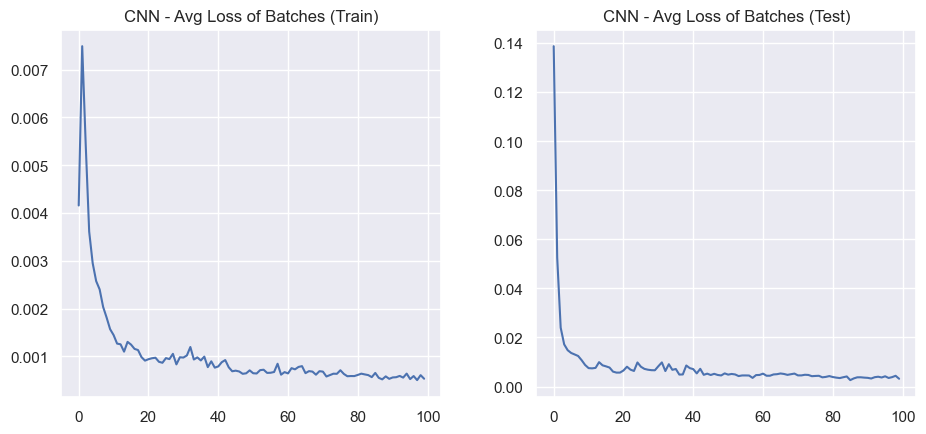

In [21]:
janela, graficos = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
plt.tight_layout(pad=3.0)
subplots = janela.axes

subplots[0].set_title('CNN - Avg Loss of Batches (Train)')
subplots[0].plot(avg_loss_batches_train_list)

subplots[1].set_title('CNN - Avg Loss of Batches (Test)')
subplots[1].plot(avg_loss_batches_test_list);

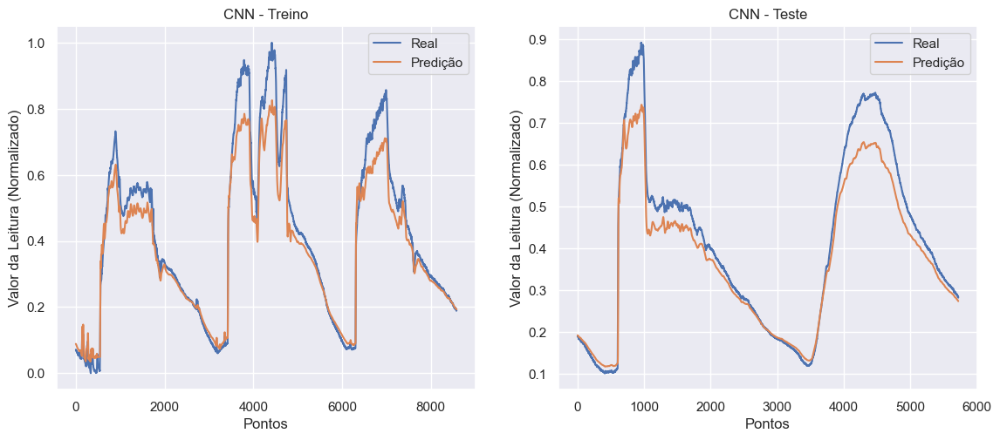

In [22]:
janela, graficos = plt.subplots(nrows=1, ncols=2, figsize=(12, 5.5))
plt.tight_layout(pad=3.0)
subplots = janela.axes

with torch.no_grad():
    inputs = X_train.to(device)
    inputs = inputs.view(inputs.size(0), 1, -1)
    y_predicted = model.forward(inputs).to('cpu').numpy()

subplots[0].plot(y_train[:], label='Real')
subplots[0].plot(y_predicted[:], label='Predição')
subplots[0].legend()
subplots[0].set_title('CNN - Treino')
subplots[0].set_xlabel('Pontos')
subplots[0].set_ylabel('Valor da Leitura (Normalizado)')

with torch.no_grad():
    inputs = X_test.to(device)
    inputs = inputs.view(inputs.size(0), 1, -1)
    y_predicted = model.forward(inputs).to('cpu').numpy()

subplots[1].plot(y_test[:], label='Real')
subplots[1].plot(y_predicted[:], label='Predição')
subplots[1].legend()
subplots[1].set_title('CNN - Teste')
subplots[1].set_xlabel('Pontos')
subplots[1].set_ylabel('Valor da Leitura (Normalizado)');

In [23]:
y_predicted = torch.tensor(y_predicted).float()
mse_loss = nn.MSELoss()
mse = mse_loss(y_predicted, y_test)
print("CNN - MSE:", mse.item())

CNN - MSE: 0.0031988718546926975


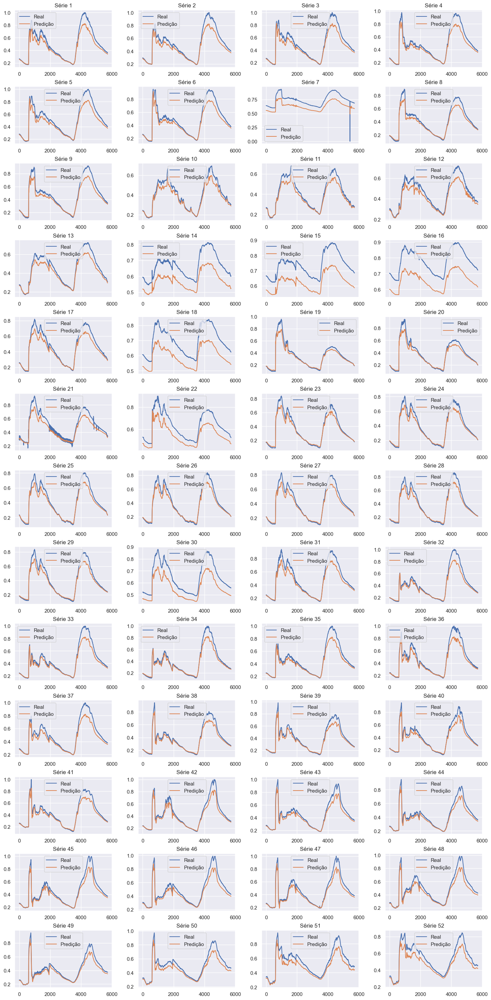

In [24]:
# Testando o modelo treinado com as 52 séries
janela, graficos = plt.subplots(nrows=13, ncols=4, figsize=(15, 30))
plt.tight_layout(pad=1.5)
subplots = janela.axes

for i in df.columns:
    df_new = pd.DataFrame(df[i])
    df_new.rename(columns={i: 't'}, inplace=True)

    # Janelamento
    window_size = 100
    for t in range(1, window_size + 1)[::-1]:
        df_new[f't{t}'] = df_new['t'].shift(t)

    df_new.dropna(inplace=True)

    # Divisão variáveis dependentes e independentes
    y_new, X_new = df_new.values[:, 0], df_new.values[:, 1:]

    X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(
        X_new, y_new, test_size=0.40, random_state=42, shuffle=False)
    
    # Incluindo dimensão para o PyTorch    
    X_test_new = X_test_new.reshape([-1, window_size, 1])    
    y_test_new = y_test_new.reshape([-1, 1])

    # Convertendo em Tensores
    X_test_new = torch.tensor(X_test_new).float()    
    y_test_new = torch.tensor(y_test_new).float()

    with torch.no_grad():
        inputs = X_test_new.to(device)
        inputs = inputs.view(inputs.size(0), 1, -1)
        y_predicted = model.forward(inputs).to('cpu').numpy()

    subplots[i].plot(y_test_new[:], label='Real')
    subplots[i].plot(y_predicted[:], label='Predição')
    subplots[i].legend()
    subplots[i].set_title(f'Série {i+1}');

##### GRU - Individual

In [25]:
class GRU(nn.Module):
    def __init__(self):
        super().__init__()

        self.gru = nn.GRU(
            input_size=1,
            hidden_size=32,
            num_layers=1,
            batch_first=True)
        self.fc = nn.Linear(32, 1)

    def forward(self, x):
        out, _ = self.gru(x)
        out = out[:, -1, :]
        out = self.fc(out)
        return out

In [26]:
model = GRU().to(device)
print(model)

# Conta o número total de parâmetros na rede
total_params = sum(p.numel() for p in model.parameters())
print(f"Total de parâmetros na rede GRU: {total_params}")

GRU(
  (gru): GRU(1, 32, batch_first=True)
  (fc): Linear(in_features=32, out_features=1, bias=True)
)
Total de parâmetros na rede GRU: 3393


In [27]:
# Treinamento
start_time = time.time()
learning_rate = 0.001
num_epochs = 100
loss_function = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

avg_loss_batches_train_list = list()
avg_loss_batches_test_list = list()
for epoch in range(1, num_epochs+1):
    model.train(True)
    running_loss = 0.0
    for batch_index, (x_batch, y_batch) in enumerate(train_loader):        
        x_batch = x_batch.to(device)
        y_batch = y_batch.to(device)        
        
        output = model(x_batch)        
        loss = loss_function(output, y_batch)
        running_loss += loss.item()
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    avg_loss_batches = running_loss / len(train_loader)
    avg_loss_batches_train_list.append(avg_loss_batches)

    model.train(False)
    running_loss = 0.0
    for batch_index, (x_batch, y_batch) in enumerate(test_loader):
        with torch.no_grad():
            x_batch = x_batch.to(device)
            y_batch = y_batch.to(device)

            output = model(x_batch)
            loss = loss_function(output, y_batch)
            running_loss += loss.item()

    avg_loss_batches = running_loss / len(test_loader)
    avg_loss_batches_test_list.append(avg_loss_batches)

    if epoch == 1 or epoch % 10 == 0:
        print('Epoch', epoch, 'Test Loss', avg_loss_batches_test_list[-1])


elapsed_time = time.time() - start_time
print(elapsed_time//60,'min,','%5.2f' % (elapsed_time%60),'seg')

Epoch 1 Test Loss 0.03746676183023914
Epoch 10 Test Loss 0.008954572304580322
Epoch 20 Test Loss 0.00046818679965932963
Epoch 30 Test Loss 0.00010512370809174007
Epoch 40 Test Loss 0.0006747701144600624
Epoch 50 Test Loss 0.0006279782922185999
Epoch 60 Test Loss 0.00021396826953633288
Epoch 70 Test Loss 0.0013528443106471013
Epoch 80 Test Loss 0.0021068879446740274
Epoch 90 Test Loss 0.00012277965564082895
Epoch 100 Test Loss 0.00028121412495161623
3.0 min, 25.17 seg


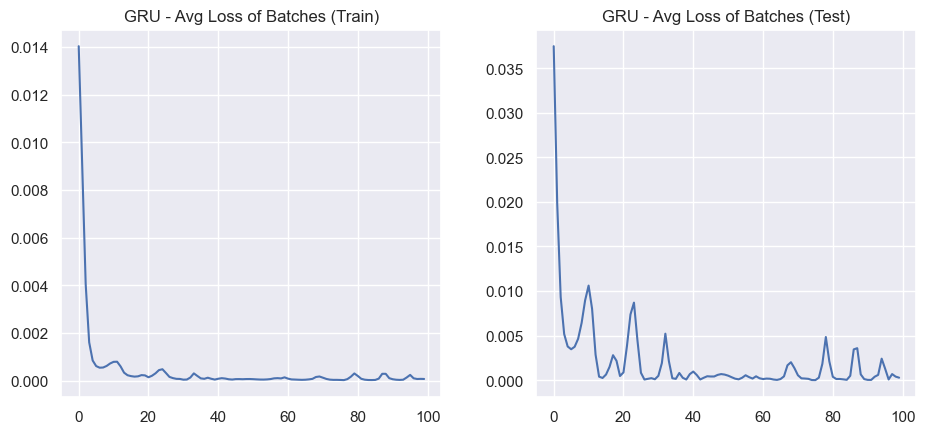

In [28]:
janela, graficos = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
plt.tight_layout(pad=3.0)
subplots = janela.axes

subplots[0].set_title('GRU - Avg Loss of Batches (Train)')
subplots[0].plot(avg_loss_batches_train_list)

subplots[1].set_title('GRU - Avg Loss of Batches (Test)')
subplots[1].plot(avg_loss_batches_test_list);

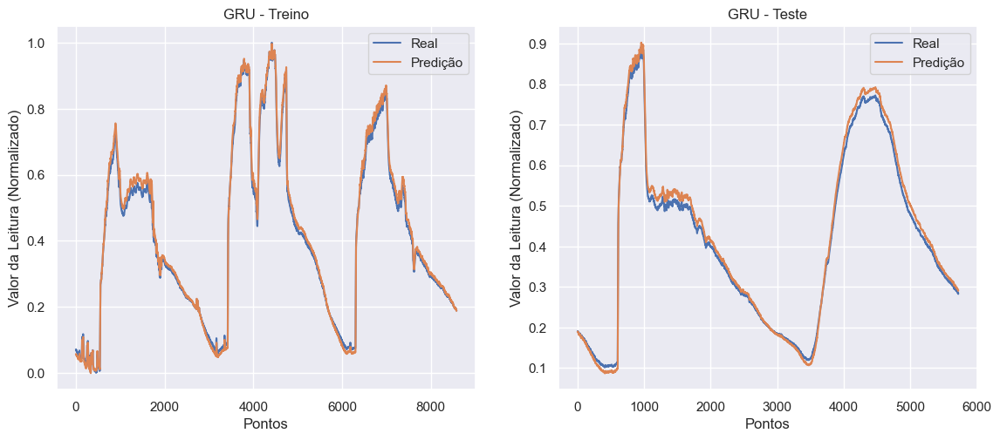

In [29]:
janela, graficos = plt.subplots(nrows=1, ncols=2, figsize=(12, 5.5))
plt.tight_layout(pad=3.0)
subplots = janela.axes

with torch.no_grad():
    y_predicted = model(X_train.to(device)).to('cpu').numpy()

subplots[0].plot(y_train[:], label='Real')
subplots[0].plot(y_predicted[:], label='Predição')
subplots[0].legend()
subplots[0].set_title('GRU - Treino')
subplots[0].set_xlabel('Pontos')
subplots[0].set_ylabel('Valor da Leitura (Normalizado)')

with torch.no_grad():
    y_predicted = model(X_test.to(device)).to('cpu').numpy()

subplots[1].plot(y_test[:], label='Real')
subplots[1].plot(y_predicted[:], label='Predição')
subplots[1].legend()
subplots[1].set_title('GRU - Teste')
subplots[1].set_xlabel('Pontos')
subplots[1].set_ylabel('Valor da Leitura (Normalizado)');

In [30]:
y_predicted = torch.tensor(y_predicted).float()
mse_loss = nn.MSELoss()
mse = mse_loss(y_predicted, y_test)
print("GRU - MSE:", mse.item())

GRU - MSE: 0.00028152629965916276


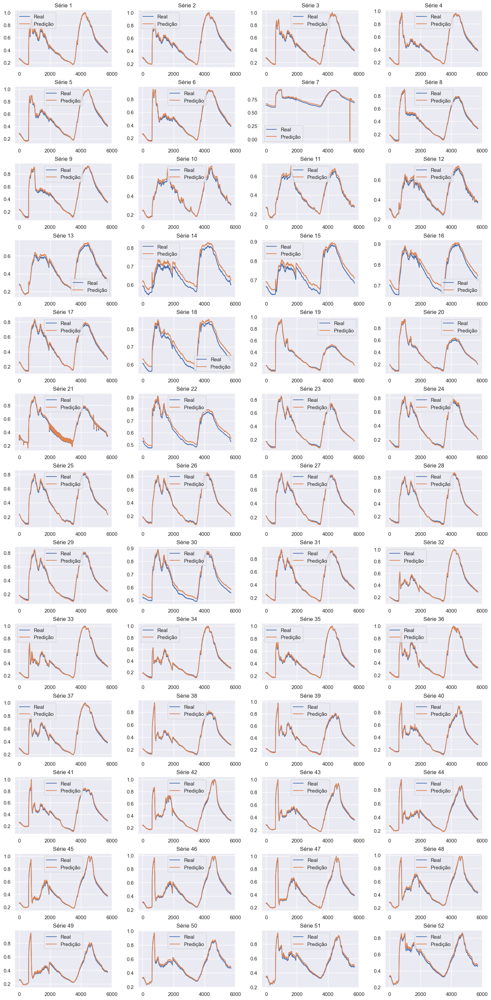

In [31]:
# Testando o modelo treinado com as 52 séries
janela, graficos = plt.subplots(nrows=13, ncols=4, figsize=(15, 30))
plt.tight_layout(pad=1.5)
subplots = janela.axes

for i in df.columns:
    df_new = pd.DataFrame(df[i])
    df_new.rename(columns={i: 't'}, inplace=True)

    # Janelamento
    window_size = 100
    for t in range(1, window_size + 1)[::-1]:
        df_new[f't{t}'] = df_new['t'].shift(t)

    df_new.dropna(inplace=True)

    # Divisão variáveis dependentes e independentes
    y_new, X_new = df_new.values[:, 0], df_new.values[:, 1:]

    X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(
        X_new, y_new, test_size=0.40, random_state=42, shuffle=False)

    # Incluindo dimensão para o PyTorch
    X_test_new = X_test_new.reshape([-1, window_size, 1])
    y_test_new = y_test_new.reshape([-1, 1])

    # Convertendo em Tensores
    X_test_new = torch.tensor(X_test_new).float()
    y_test_new = torch.tensor(y_test_new).float()

    with torch.no_grad():        
        y_predicted = model.forward(X_test_new.to(device)).to('cpu').numpy()

    subplots[i].plot(y_test_new[:], label='Real')
    subplots[i].plot(y_predicted[:], label='Predição')
    subplots[i].legend()
    subplots[i].set_title(f'Série {i+1}');

##### LSTM - Individual

In [32]:
class LSTM(nn.Module):
    def __init__(self):
        super().__init__()
        
        self.lstm = nn.LSTM(
            input_size = 1,
            hidden_size = 32,
            num_layers = 1, 
            batch_first=True)
        self.fc = nn.Linear(32, 1)
        
    def forward(self, x):
        out, _ = self.lstm(x)
        out = out[:, -1, :]
        out = self.fc(out)
        return out

In [33]:
model = LSTM().to(device)
print(model)

# Conta o número total de parâmetros na rede
total_params = sum(p.numel() for p in model.parameters())
print(f"Total de parâmetros na rede LSTM: {total_params}")

LSTM(
  (lstm): LSTM(1, 32, batch_first=True)
  (fc): Linear(in_features=32, out_features=1, bias=True)
)
Total de parâmetros na rede LSTM: 4513


In [34]:
# Treinamento
start_time = time.time()
learning_rate = 0.001
num_epochs = 100
loss_function = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

avg_loss_batches_train_list = list()
avg_loss_batches_test_list = list()
for epoch in range(1, num_epochs+1):
    model.train(True)
    running_loss = 0.0
    for batch_index, (x_batch, y_batch) in enumerate(train_loader):        
        x_batch = x_batch.to(device)
        y_batch = y_batch.to(device)        
        
        output = model(x_batch)        
        loss = loss_function(output, y_batch)
        running_loss += loss.item()
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    avg_loss_batches = running_loss / len(train_loader)
    avg_loss_batches_train_list.append(avg_loss_batches)

    model.train(False)
    running_loss = 0.0
    for batch_index, (x_batch, y_batch) in enumerate(test_loader):
        with torch.no_grad():
            x_batch = x_batch.to(device)
            y_batch = y_batch.to(device)

            output = model(x_batch)
            loss = loss_function(output, y_batch)
            running_loss += loss.item()

    avg_loss_batches = running_loss / len(test_loader)
    avg_loss_batches_test_list.append(avg_loss_batches)

    if epoch == 1 or epoch % 10 == 0:
        print('Epoch', epoch, 'Test Loss', avg_loss_batches_test_list[-1])


elapsed_time = time.time() - start_time
print(elapsed_time//60,'min,','%5.2f' % (elapsed_time%60),'seg')

Epoch 1 Test Loss 0.05339773020986579
Epoch 10 Test Loss 0.0060925766666419445
Epoch 20 Test Loss 0.002229647760328537
Epoch 30 Test Loss 0.0006065297976815651
Epoch 40 Test Loss 0.0003222821877184999
Epoch 50 Test Loss 0.0003417946151150658
Epoch 60 Test Loss 0.0005257374201112804
Epoch 70 Test Loss 0.000568171348870133
Epoch 80 Test Loss 0.000544772067117102
Epoch 90 Test Loss 0.0005006050734999975
Epoch 100 Test Loss 0.00047080714108127156
3.0 min, 32.19 seg


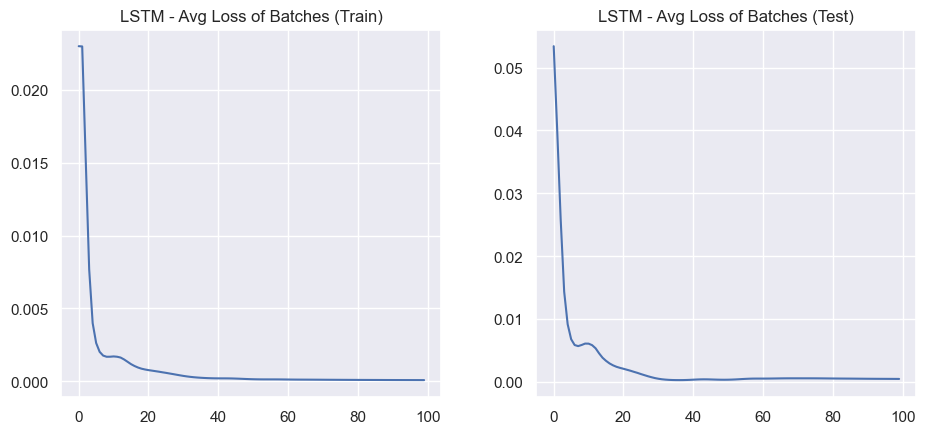

In [35]:
janela, graficos = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
plt.tight_layout(pad=3.0)
subplots = janela.axes

subplots[0].set_title('LSTM - Avg Loss of Batches (Train)')
subplots[0].plot(avg_loss_batches_train_list)

subplots[1].set_title('LSTM - Avg Loss of Batches (Test)')
subplots[1].plot(avg_loss_batches_test_list);

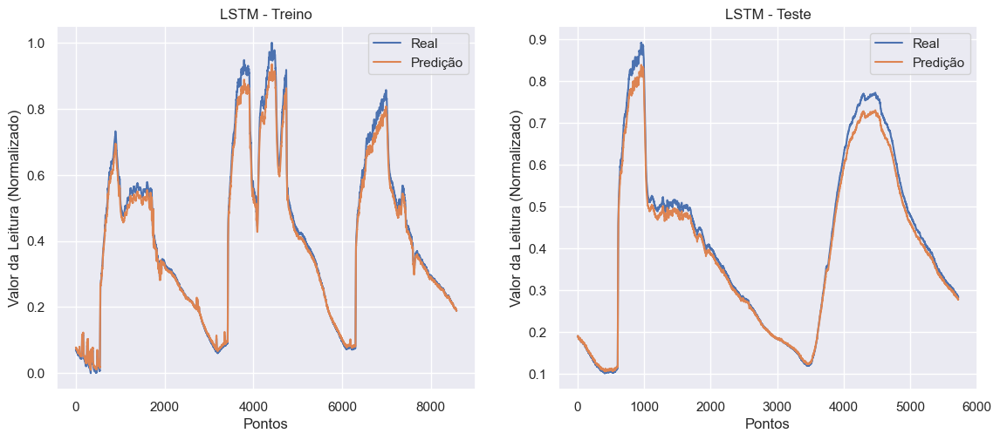

In [36]:
janela, graficos = plt.subplots(nrows=1, ncols=2, figsize=(12, 5.5))
plt.tight_layout(pad=3.0)
subplots = janela.axes

with torch.no_grad():
    y_predicted = model(X_train.to(device)).to('cpu').numpy()

subplots[0].plot(y_train[:], label='Real')
subplots[0].plot(y_predicted[:], label='Predição')
subplots[0].legend()
subplots[0].set_title('LSTM - Treino')
subplots[0].set_xlabel('Pontos')
subplots[0].set_ylabel('Valor da Leitura (Normalizado)')

with torch.no_grad():
    y_predicted = model(X_test.to(device)).to('cpu').numpy()

subplots[1].plot(y_test[:], label='Real')
subplots[1].plot(y_predicted[:], label='Predição')
subplots[1].legend()
subplots[1].set_title('LSTM - Teste')
subplots[1].set_xlabel('Pontos')
subplots[1].set_ylabel('Valor da Leitura (Normalizado)');

In [37]:
y_predicted = torch.tensor(y_predicted).float()
mse_loss = nn.MSELoss()
mse = mse_loss(y_predicted, y_test)
print("LSTM - MSE:", mse.item())

LSTM - MSE: 0.00047142364201135933


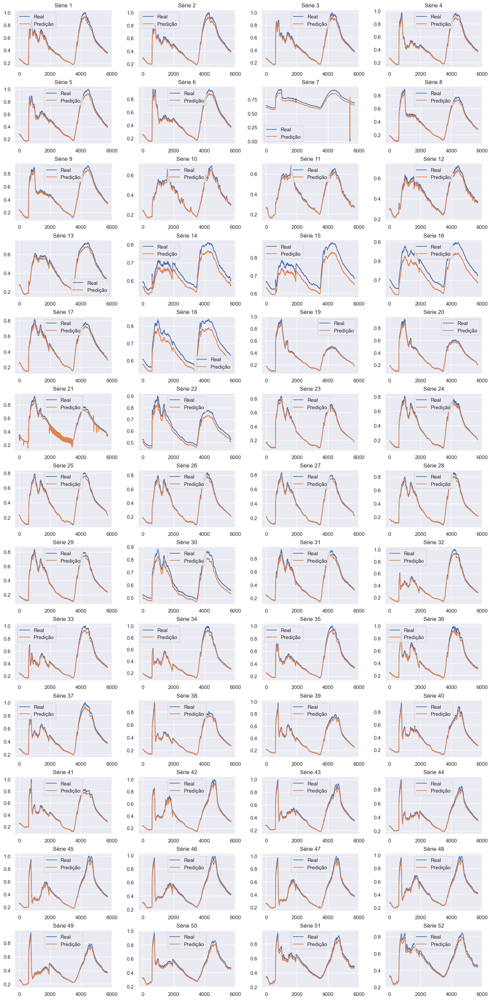

In [38]:
# Testando o modelo treinado com as 52 séries
janela, graficos = plt.subplots(nrows=13, ncols=4, figsize=(15, 30))
plt.tight_layout(pad=1.5)
subplots = janela.axes

for i in df.columns:
    df_new = pd.DataFrame(df[i])
    df_new.rename(columns={i: 't'}, inplace=True)

    # Janelamento
    window_size = 100
    for t in range(1, window_size + 1)[::-1]:
        df_new[f't{t}'] = df_new['t'].shift(t)

    df_new.dropna(inplace=True)

    # Divisão variáveis dependentes e independentes
    y_new, X_new = df_new.values[:, 0], df_new.values[:, 1:]

    X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(
        X_new, y_new, test_size=0.40, random_state=42, shuffle=False)

    # Incluindo dimensão para o PyTorch
    X_test_new = X_test_new.reshape([-1, window_size, 1])
    y_test_new = y_test_new.reshape([-1, 1])

    # Convertendo em Tensores
    X_test_new = torch.tensor(X_test_new).float()
    y_test_new = torch.tensor(y_test_new).float()

    with torch.no_grad():
        y_predicted = model.forward(X_test_new.to(device)).to('cpu').numpy()

    subplots[i].plot(y_test_new[:], label='Real')
    subplots[i].plot(y_predicted[:], label='Predição')
    subplots[i].legend()
    subplots[i].set_title(f'Série {i+1}');

##### Abordagem - Conjunto

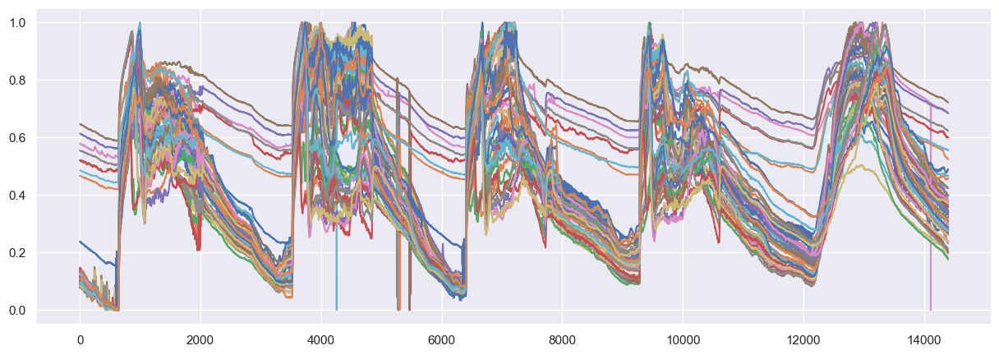

In [157]:
# Com outliers
df.plot(legend=False, figsize=(15, 5));

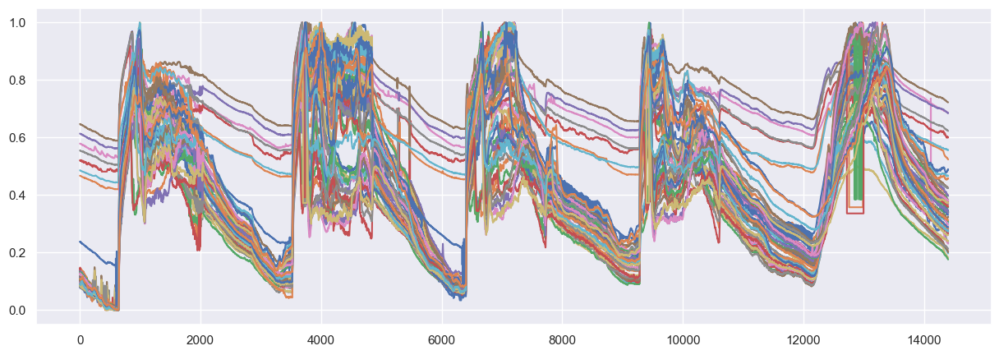

In [158]:
# Sem outliers
df_clean.plot(legend=False, figsize=(15, 5));

In [159]:
def do_windowing(df, serie):
    window_size = 100       
    df_new = pd.DataFrame(df[serie])
    df_new.rename(columns={serie: 't'}, inplace=True)

    # Janelamento        
    for t in range(1, window_size + 1)[::-1]:
        df_new[f't{t}'] = df_new['t'].shift(t)

    df_new.dropna(inplace=True)    

    return df_new

In [160]:
lista_df = []
for i in df.columns:
    lista_df.append(do_windowing(df_clean, i))

In [161]:
lista_X_train = []
lista_X_test = []
lista_y_train = []
lista_y_test = []

for i in lista_df:
    # Divisão variáveis dependentes e independentes
    df_series = i.values    
    y_new, X_new = df_series[:, 0], df_series[:, 1:]

    X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(
        X_new, y_new, test_size=0.40, random_state=42, shuffle=False)

    lista_X_train.append(X_train_new)
    lista_X_test.append(X_test_new)
    lista_y_train.append(y_train_new)
    lista_y_test.append(y_test_new)

In [162]:
X_train = np.stack(lista_X_train, axis=1)
y_train = np.stack(lista_y_train, axis=1)
X_test = np.stack(lista_X_test, axis=1)
y_test = np.stack(lista_y_test, axis=1)

# Convertendo em Tensores
X_train = torch.tensor(X_train).float()
y_train = torch.tensor(y_train).float()
X_test = torch.tensor(X_test).float()
y_test = torch.tensor(y_test).float()

In [204]:
train_ds = StockDataset(X_train, y_train)
test_ds = StockDataset(X_test, y_test)

train_loader = DataLoader(train_ds, batch_size=16, shuffle=False)
test_loader = DataLoader(test_ds, batch_size=16, shuffle=False)

##### CNN - Conjunto

In [168]:
class CNN(nn.Module):
    def __init__(self):
        super().__init__()
        # 52 canais 1D
        self.conv1 = nn.Conv1d(52, 16, kernel_size=3, stride=1, padding=1)
        self.relu = nn.ReLU()
        # [N-F+(2P)]/S + 1 = [100-3+(2*1)]/1 + 1 = 100
        # 100 * 16 canais = 1600
        self.conv2 = nn.Conv1d(16, 16, kernel_size=3, stride=1, padding=1)
        # [N-F+(2P)]/S + 1 = [100-3+(2*1)]/1 + 1 = 100
        # 100 * 16 canais = 1600
        self.fc1 = nn.Linear(1600, 416)
        self.fc2 = nn.Linear(416, 208)
        self.fc3 = nn.Linear(208, 52)

    def forward(self, x):
        x = self.relu(self.conv1(x))        
        x = self.relu(self.conv2(x))
        x = x.view(x.size(0), -1)
        x = self.relu(self.fc1(x))
        x = self.relu(self.fc2(x))
        x = self.fc3(x)

        return x

In [169]:
model = CNN().to(device)
print(model)

# Conta o número total de parâmetros na rede
total_params = sum(p.numel() for p in model.parameters())
print(f"Total de parâmetros na rede CNN: {total_params}")

CNN(
  (conv1): Conv1d(52, 16, kernel_size=(3,), stride=(1,), padding=(1,))
  (relu): ReLU()
  (conv2): Conv1d(16, 16, kernel_size=(3,), stride=(1,), padding=(1,))
  (fc1): Linear(in_features=1600, out_features=416, bias=True)
  (fc2): Linear(in_features=416, out_features=208, bias=True)
  (fc3): Linear(in_features=208, out_features=52, bias=True)
)
Total de parâmetros na rede CNN: 766916


In [170]:
# Treinamento
start_time = time.time()
learning_rate = 0.001
num_epochs = 100
loss_function = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

avg_loss_batches_train_list = list()
avg_loss_batches_test_list = list()
for epoch in range(1, num_epochs+1):
    model.train(True)
    running_loss = 0.0
    for batch_index, (x_batch, y_batch) in enumerate(train_loader):         
        x_batch = x_batch.to(device)
        y_batch = y_batch.to(device)        
        
        output = model(x_batch)        
        loss = loss_function(output, y_batch)
        running_loss += loss.item()
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    avg_loss_batches = running_loss / len(train_loader)
    avg_loss_batches_train_list.append(avg_loss_batches)

    model.train(False)
    running_loss = 0.0
    for batch_index, (x_batch, y_batch) in enumerate(test_loader):
        with torch.no_grad():            
            x_batch = x_batch.to(device)
            y_batch = y_batch.to(device)

            output = model(x_batch)
            loss = loss_function(output, y_batch)
            running_loss += loss.item()

    avg_loss_batches = running_loss / len(test_loader)
    avg_loss_batches_test_list.append(avg_loss_batches)

    if epoch == 1 or epoch % 10 == 0:
        print('Epoch', epoch, 'Test Loss', avg_loss_batches_test_list[-1])


elapsed_time = time.time() - start_time
print(elapsed_time//60,'min,','%5.2f' % (elapsed_time%60),'seg')

Epoch 1 Test Loss 0.08779428446382172
Epoch 10 Test Loss 0.015826542233710383
Epoch 20 Test Loss 0.4569616875926347
Epoch 30 Test Loss 0.014632215128230144
Epoch 40 Test Loss 0.01152375044517236
Epoch 50 Test Loss 0.014118843177028127
Epoch 60 Test Loss 0.012849470407042884
Epoch 70 Test Loss 0.013718857856195189
Epoch 80 Test Loss 0.00992612203877574
Epoch 90 Test Loss 0.010804065111640018
Epoch 100 Test Loss 0.009611671520253986
4.0 min, 52.58 seg


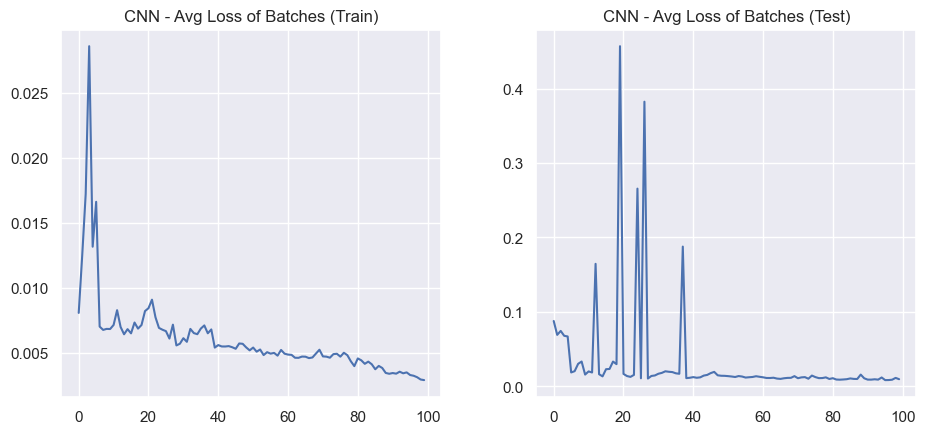

In [171]:
janela, graficos = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
plt.tight_layout(pad=3.0)
subplots = janela.axes

subplots[0].set_title('CNN - Avg Loss of Batches (Train)')
subplots[0].plot(avg_loss_batches_train_list)

subplots[1].set_title('CNN - Avg Loss of Batches (Test)')
subplots[1].plot(avg_loss_batches_test_list);

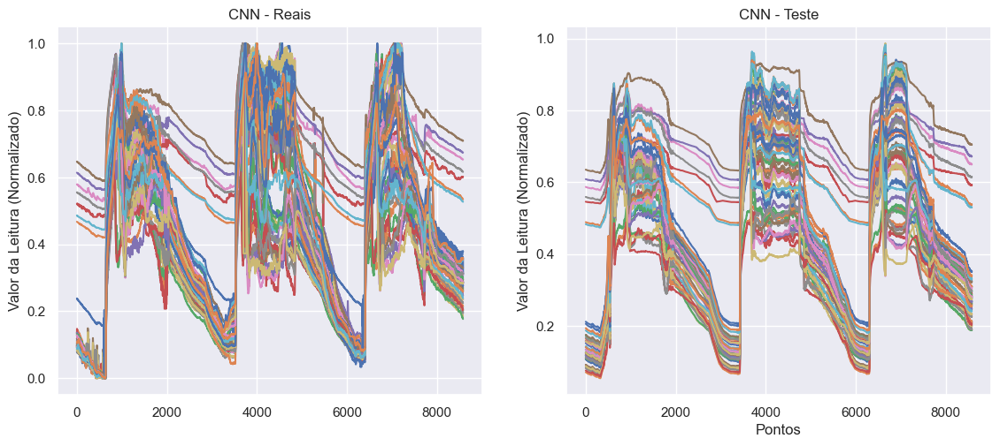

In [172]:
janela, graficos = plt.subplots(nrows=1, ncols=2, figsize=(12, 5.5))
plt.tight_layout(pad=3.0)
subplots = janela.axes

subplots[0].plot(df_clean[:8580])
subplots[0].xaxis.clear()
subplots[0].set_title('CNN - Reais')
subplots[0].set_xlabel('Pontos')
subplots[0].set_ylabel('Valor da Leitura (Normalizado)')

with torch.no_grad():    
    inputs = X_train.to(device)    
    y_predicted = model.forward(inputs).to('cpu').numpy()

subplots[1].plot(y_predicted[:])
subplots[0].xaxis.clear()
subplots[1].set_title('CNN - Teste')
subplots[1].set_xlabel('Pontos')
subplots[1].set_ylabel('Valor da Leitura (Normalizado)');

In [173]:
with torch.no_grad():
    y_predicted = model(X_test.to(device)).to('cpu').numpy()

mse_loss = nn.MSELoss()
mse = []
for i in range(y_test.shape[1]):
    mse.append(mse_loss(y_test[:, i], torch.tensor(y_predicted[:, i])).item())
    print(f'MSE {i}', mse[i])

MSE 0 0.012880980037152767
MSE 1 0.016180070117115974
MSE 2 0.012969763949513435
MSE 3 0.01564156264066696
MSE 4 0.015937991440296173
MSE 5 0.013823402114212513
MSE 6 0.002270690631121397
MSE 7 0.008497597649693489
MSE 8 0.012101788073778152
MSE 9 0.008194930851459503
MSE 10 0.006233480293303728
MSE 11 0.0059118615463376045
MSE 12 0.006458960007876158
MSE 13 0.0025007780641317368
MSE 14 0.0020869867876172066
MSE 15 0.0009857906261458993
MSE 16 0.002033790573477745
MSE 17 0.0007365111960098147
MSE 18 0.00320585654117167
MSE 19 0.00175194360781461
MSE 20 0.0013027730165049434
MSE 21 0.00039773579919710755
MSE 22 0.0014947354793548584
MSE 23 0.0022067080717533827
MSE 24 0.003567752195522189
MSE 25 0.004403946455568075
MSE 26 0.003099098801612854
MSE 27 0.005984735209494829
MSE 28 0.003033767454326153
MSE 29 0.0014311163686215878
MSE 30 0.007099228445440531
MSE 31 0.026477491483092308
MSE 32 0.03333556652069092
MSE 33 0.024014536291360855
MSE 34 0.02419195882976055
MSE 35 0.016715124249458

In [174]:
# Média das MSEs
print(f'Média das MSEs:', np.mean(mse))

Média das MSEs: 0.009622770698535113


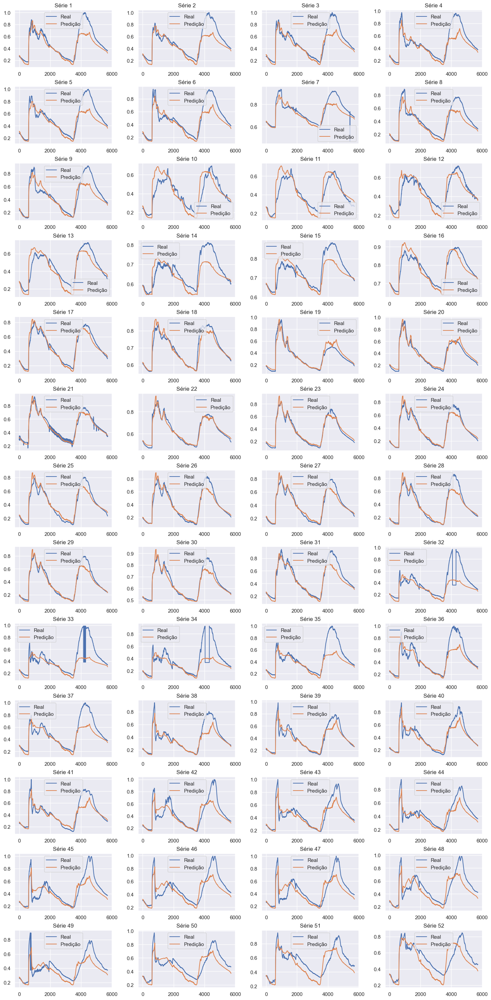

In [175]:
# Teste isolado das 52 séries
janela, graficos = plt.subplots(nrows=13, ncols=4, figsize=(15, 30))
plt.tight_layout(pad=1.5)
subplots = janela.axes

with torch.no_grad():
    y_predicted = model(X_test.to(device)).to('cpu').numpy()

for i in range(y_test.shape[1]):
    subplots[i].plot(y_test[:, i], label='Real')
    subplots[i].plot(y_predicted[:, i], label='Predição')
    subplots[i].legend()
    subplots[i].set_title(f'Série {i+1}');

##### GRU - Conjunto

In [195]:
class GRU(nn.Module):
    def __init__(self):
        super().__init__()

        self.gru = nn.GRU(
            input_size=100,
            hidden_size=104,
            num_layers=1,
            batch_first=True)
        self.fc = nn.Linear(104, 52)

    def forward(self, x):
        out, _ = self.gru(x)
        out = out[:, -1, :]
        out = self.fc(out)
        return out

In [197]:
model = GRU().to(device)
print(model)

# Conta o número total de parâmetros na rede
total_params = sum(p.numel() for p in model.parameters())
print(f"Total de parâmetros na rede GRU: {total_params}")

GRU(
  (gru): GRU(100, 104, batch_first=True)
  (fc): Linear(in_features=104, out_features=52, bias=True)
)
Total de parâmetros na rede GRU: 69732


In [198]:
# Treinamento
start_time = time.time()
learning_rate = 0.001
num_epochs = 100
loss_function = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

avg_loss_batches_train_list = list()
avg_loss_batches_test_list = list()
for epoch in range(1, num_epochs+1):
    model.train(True)
    running_loss = 0.0
    for batch_index, (x_batch, y_batch) in enumerate(train_loader):        
        x_batch = x_batch.to(device)
        y_batch = y_batch.to(device)        
        
        output = model(x_batch)        
        loss = loss_function(output, y_batch)
        running_loss += loss.item()
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    avg_loss_batches = running_loss / len(train_loader)
    avg_loss_batches_train_list.append(avg_loss_batches)

    model.train(False)
    running_loss = 0.0
    for batch_index, (x_batch, y_batch) in enumerate(test_loader):
        with torch.no_grad():
            x_batch = x_batch.to(device)
            y_batch = y_batch.to(device)

            output = model(x_batch)
            loss = loss_function(output, y_batch)
            running_loss += loss.item()

    avg_loss_batches = running_loss / len(test_loader)
    avg_loss_batches_test_list.append(avg_loss_batches)

    if epoch == 1 or epoch % 10 == 0:
        print('Epoch', epoch, 'Test Loss', avg_loss_batches_test_list[-1])

elapsed_time = time.time() - start_time
print(elapsed_time//60,'min,','%5.2f' % (elapsed_time%60),'seg')

Epoch 1 Test Loss 0.13143536863907426
Epoch 10 Test Loss 0.0401472416710448
Epoch 20 Test Loss 0.050208614641638255
Epoch 30 Test Loss 0.03638454323781488
Epoch 40 Test Loss 0.02939444754847297
Epoch 50 Test Loss 0.01938701086734843
Epoch 60 Test Loss 0.02106135473715066
Epoch 70 Test Loss 0.022663442003818726
Epoch 80 Test Loss 0.019875240584951825
Epoch 90 Test Loss 0.021657160203847007
Epoch 100 Test Loss 0.01986907730736284
3.0 min, 36.44 seg


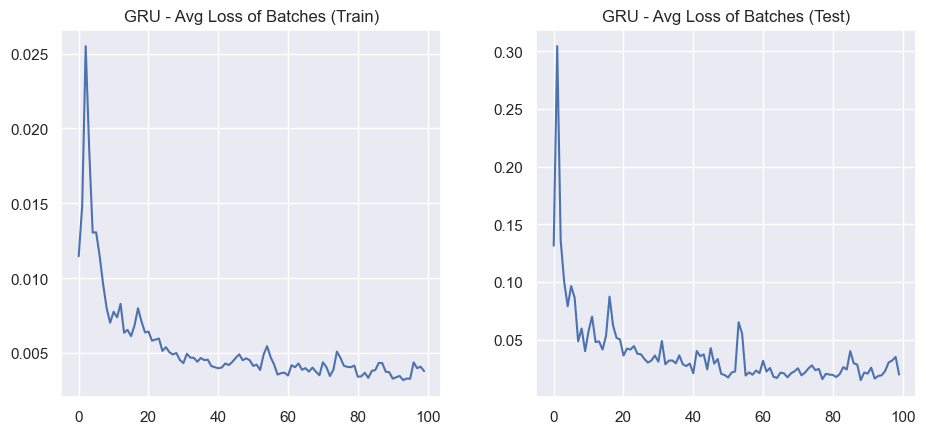

In [199]:
janela, graficos = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
plt.tight_layout(pad=3.0)
subplots = janela.axes

subplots[0].set_title('GRU - Avg Loss of Batches (Train)')
subplots[0].plot(avg_loss_batches_train_list)

subplots[1].set_title('GRU - Avg Loss of Batches (Test)')
subplots[1].plot(avg_loss_batches_test_list);

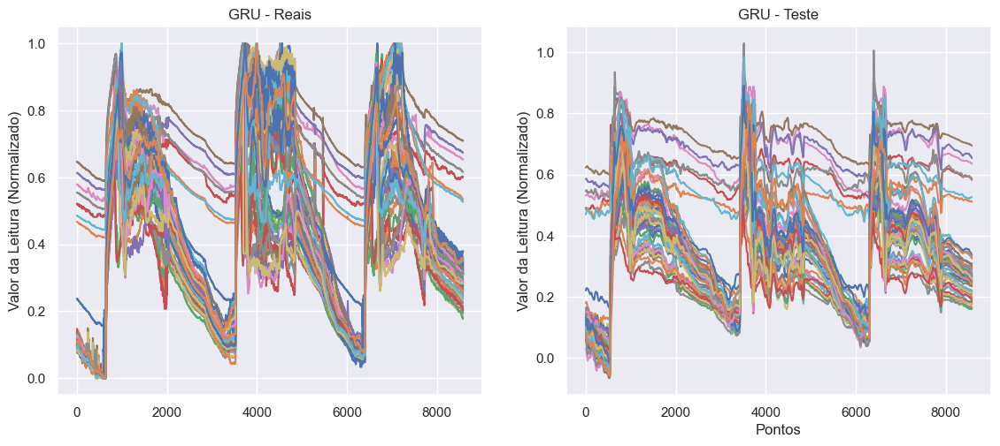

In [200]:
janela, graficos = plt.subplots(nrows=1, ncols=2, figsize=(12, 5.5))
plt.tight_layout(pad=3.0)
subplots = janela.axes

subplots[0].plot(df_clean[:8580])
subplots[0].xaxis.clear()
subplots[0].set_title('GRU - Reais')
subplots[0].set_xlabel('Pontos')
subplots[0].set_ylabel('Valor da Leitura (Normalizado)')

with torch.no_grad():
    inputs = X_train.to(device)
    y_predicted = model.forward(inputs).to('cpu').numpy()

subplots[1].plot(y_predicted[:])
subplots[0].xaxis.clear()
subplots[1].set_title('GRU - Teste')
subplots[1].set_xlabel('Pontos')
subplots[1].set_ylabel('Valor da Leitura (Normalizado)');

In [201]:
with torch.no_grad():
    y_predicted = model(X_test.to(device)).to('cpu').numpy()

mse_loss = nn.MSELoss()
mse = []
for i in range(y_test.shape[1]):
    mse.append(mse_loss(y_test[:, i], torch.tensor(y_predicted[:, i])).item())
    print(f'MSE {i}', mse[i])

MSE 0 0.04052441194653511
MSE 1 0.024460284039378166
MSE 2 0.028842031955718994
MSE 3 0.015514414757490158
MSE 4 0.020718298852443695
MSE 5 0.013841008767485619
MSE 6 0.0027804060373455286
MSE 7 0.02539524808526039
MSE 8 0.022657204419374466
MSE 9 0.01150698121637106
MSE 10 0.014509741216897964
MSE 11 0.01380687765777111
MSE 12 0.012486291117966175
MSE 13 0.0034909022506326437
MSE 14 0.003161367727443576
MSE 15 0.0030159782618284225
MSE 16 0.023651838302612305
MSE 17 0.007905869744718075
MSE 18 0.02795874886214733
MSE 19 0.0271593164652586
MSE 20 0.020703695714473724
MSE 21 0.011992770247161388
MSE 22 0.03133676201105118
MSE 23 0.03477765619754791
MSE 24 0.036990195512771606
MSE 25 0.04161874204874039
MSE 26 0.03676475211977959
MSE 27 0.05221789702773094
MSE 28 0.03895227983593941
MSE 29 0.008097188547253609
MSE 30 0.039855681359767914
MSE 31 0.03917108103632927
MSE 32 0.03489863499999046
MSE 33 0.04052547737956047
MSE 34 0.03520883247256279
MSE 35 0.035044681280851364
MSE 36 0.0255487

In [202]:
# Média das MSEs
print(f'Média das MSEs:', np.mean(mse))

Média das MSEs: 0.019894873736820255


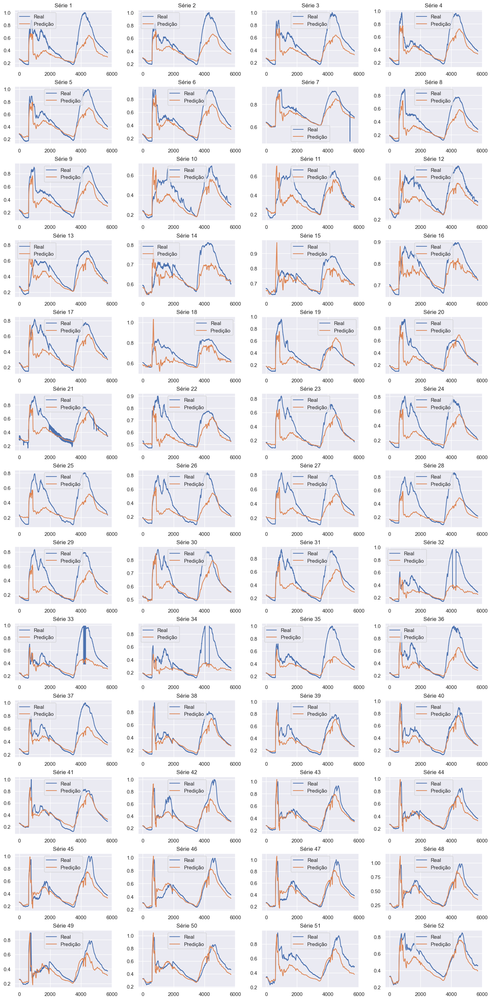

In [203]:
# Teste isolado das 52 séries
janela, graficos = plt.subplots(nrows=13, ncols=4, figsize=(15, 30))
plt.tight_layout(pad=1.5)
subplots = janela.axes

with torch.no_grad():
    y_predicted = model(X_test.to(device)).to('cpu').numpy()

for i in range(y_test.shape[1]):
    subplots[i].plot(y_test[:, i], label='Real')
    subplots[i].plot(y_predicted[:, i], label='Predição')
    subplots[i].legend()
    subplots[i].set_title(f'Série {i+1}');

##### LSTM - Conjunto

In [205]:
class LSTM(nn.Module):
    def __init__(self):
        super().__init__()

        self.lstm = nn.LSTM(
            input_size=100,
            hidden_size=104,
            num_layers=1,
            batch_first=True)
        self.fc = nn.Linear(104, 52)

    def forward(self, x):
        out, _ = self.lstm(x)
        out = out[:, -1, :]
        out = self.fc(out)
        return out

In [206]:
model = LSTM().to(device)
print(model)

# Conta o número total de parâmetros na rede
total_params = sum(p.numel() for p in model.parameters())
print(f"Total de parâmetros na rede LSTM: {total_params}")

LSTM(
  (lstm): LSTM(100, 104, batch_first=True)
  (fc): Linear(in_features=104, out_features=52, bias=True)
)
Total de parâmetros na rede LSTM: 91156


In [207]:
# Treinamento
start_time = time.time()
learning_rate = 0.001
num_epochs = 100
loss_function = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

avg_loss_batches_train_list = list()
avg_loss_batches_test_list = list()
for epoch in range(1, num_epochs+1):
    model.train(True)
    running_loss = 0.0
    for batch_index, (x_batch, y_batch) in enumerate(train_loader):        
        x_batch = x_batch.to(device)
        y_batch = y_batch.to(device)        
        
        output = model(x_batch)        
        loss = loss_function(output, y_batch)
        running_loss += loss.item()
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    avg_loss_batches = running_loss / len(train_loader)
    avg_loss_batches_train_list.append(avg_loss_batches)

    model.train(False)
    running_loss = 0.0
    for batch_index, (x_batch, y_batch) in enumerate(test_loader):
        with torch.no_grad():
            x_batch = x_batch.to(device)
            y_batch = y_batch.to(device)

            output = model(x_batch)
            loss = loss_function(output, y_batch)
            running_loss += loss.item()

    avg_loss_batches = running_loss / len(test_loader)
    avg_loss_batches_test_list.append(avg_loss_batches)

    if epoch == 1 or epoch % 10 == 0:
        print('Epoch', epoch, 'Test Loss', avg_loss_batches_test_list[-1])

elapsed_time = time.time() - start_time
print(elapsed_time//60,'min,','%5.2f' % (elapsed_time%60),'seg')

Epoch 1 Test Loss 0.074626613221022
Epoch 10 Test Loss 0.043106172820205235
Epoch 20 Test Loss 0.031265158972516915
Epoch 30 Test Loss 0.03160919458345203
Epoch 40 Test Loss 0.03283070873448953
Epoch 50 Test Loss 0.027322116478513108
Epoch 60 Test Loss 0.02300147253394162
Epoch 70 Test Loss 0.018374635949021976
Epoch 80 Test Loss 0.016769361940024593
Epoch 90 Test Loss 0.02074395211975418
Epoch 100 Test Loss 0.01990218910205896
10.0 min, 39.16 seg


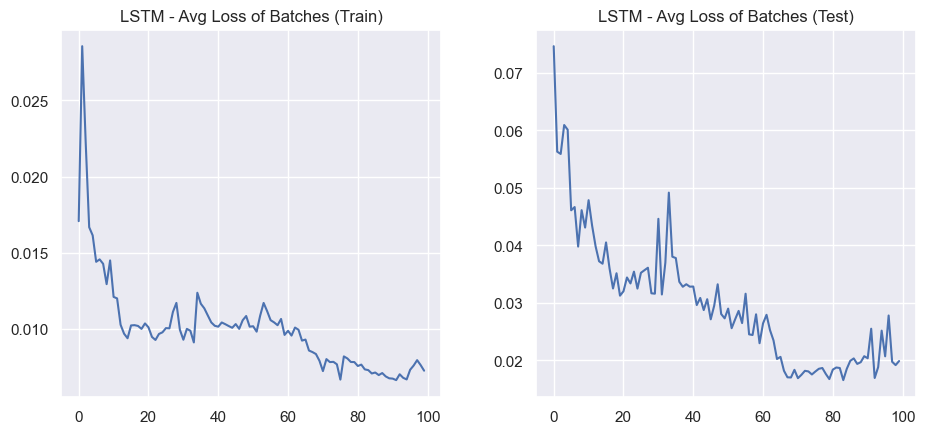

In [208]:
janela, graficos = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
plt.tight_layout(pad=3.0)
subplots = janela.axes

subplots[0].set_title('LSTM - Avg Loss of Batches (Train)')
subplots[0].plot(avg_loss_batches_train_list)

subplots[1].set_title('LSTM - Avg Loss of Batches (Test)')
subplots[1].plot(avg_loss_batches_test_list);

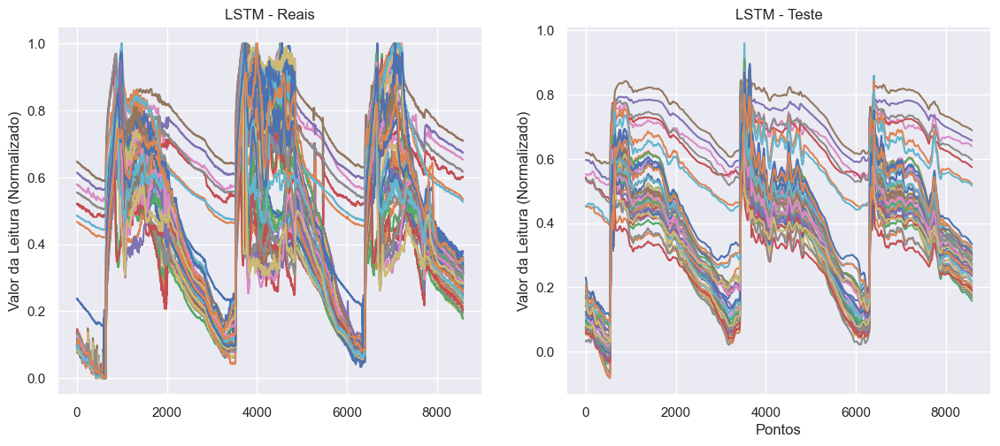

In [209]:
janela, graficos = plt.subplots(nrows=1, ncols=2, figsize=(12, 5.5))
plt.tight_layout(pad=3.0)
subplots = janela.axes

subplots[0].plot(df_clean[:8580])
subplots[0].xaxis.clear()
subplots[0].set_title('LSTM - Reais')
subplots[0].set_xlabel('Pontos')
subplots[0].set_ylabel('Valor da Leitura (Normalizado)')

with torch.no_grad():
    inputs = X_train.to(device)
    y_predicted = model.forward(inputs).to('cpu').numpy()

subplots[1].plot(y_predicted[:])
subplots[0].xaxis.clear()
subplots[1].set_title('LSTM - Teste')
subplots[1].set_xlabel('Pontos')
subplots[1].set_ylabel('Valor da Leitura (Normalizado)');

In [210]:
with torch.no_grad():
    y_predicted = model(X_test.to(device)).to('cpu').numpy()

mse_loss = nn.MSELoss()
mse = []
for i in range(y_test.shape[1]):
    mse.append(mse_loss(y_test[:, i], torch.tensor(y_predicted[:, i])).item())
    print(f'MSE {i}', mse[i])

MSE 0 0.03461085632443428
MSE 1 0.03351977840065956
MSE 2 0.02864953875541687
MSE 3 0.03647706285119057
MSE 4 0.03491205722093582
MSE 5 0.03198124095797539
MSE 6 0.007982684299349785
MSE 7 0.021692320704460144
MSE 8 0.0226889681071043
MSE 9 0.004529244266450405
MSE 10 0.005398870445787907
MSE 11 0.0036848539020866156
MSE 12 0.004646810237318277
MSE 13 0.0018608004320412874
MSE 14 0.0019060237100347877
MSE 15 0.0012232438893988729
MSE 16 0.008209859021008015
MSE 17 0.0024197420570999384
MSE 18 0.015218663960695267
MSE 19 0.013521852903068066
MSE 20 0.011632376350462437
MSE 21 0.00520853977650404
MSE 22 0.01516755111515522
MSE 23 0.017699887976050377
MSE 24 0.02130028046667576
MSE 25 0.021774709224700928
MSE 26 0.020259151235222816
MSE 27 0.02622285671532154
MSE 28 0.020166274160146713
MSE 29 0.01009779330343008
MSE 30 0.027067122980952263
MSE 31 0.03396971896290779
MSE 32 0.039831023663282394
MSE 33 0.031833961606025696
MSE 34 0.041062138974666595
MSE 35 0.03851102292537689
MSE 36 0.037

In [211]:
# Média das MSEs
print(f'Média das MSEs:', np.mean(mse))

Média das MSEs: 0.019927658163046893


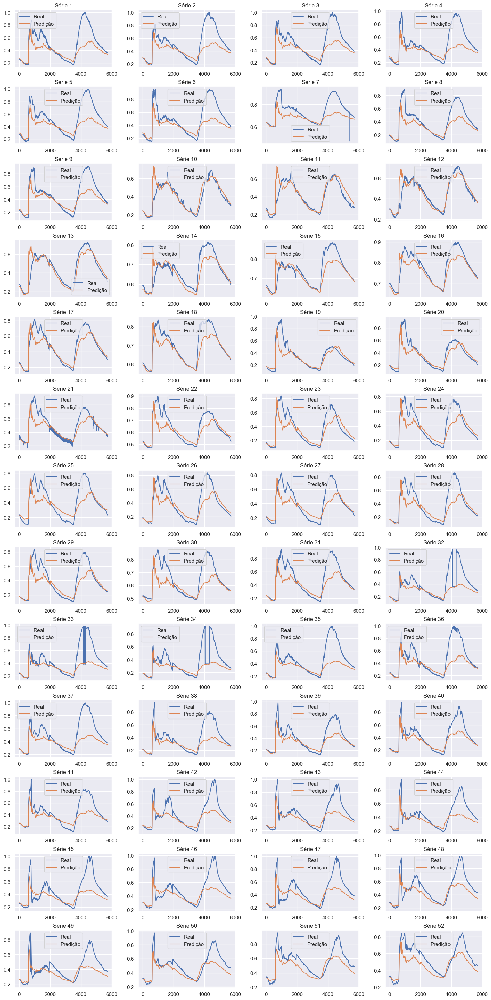

In [212]:
# Teste isolado das 52 séries
janela, graficos = plt.subplots(nrows=13, ncols=4, figsize=(15, 30))
plt.tight_layout(pad=1.5)
subplots = janela.axes

with torch.no_grad():
    y_predicted = model(X_test.to(device)).to('cpu').numpy()

for i in range(y_test.shape[1]):
    subplots[i].plot(y_test[:, i], label='Real')
    subplots[i].plot(y_predicted[:, i], label='Predição')
    subplots[i].legend()
    subplots[i].set_title(f'Série {i+1}');